# INDENG 243 &nbsp; Project - Module 1

## *GoodReads*: Book Analytics & Recommendation System

- @Group: 18
- @Member: Yanbo Wang, Yinuo Hu, Jiaming Xiong, Shichen Wu, Xinlin Huang, Wenxuan Yang

## Agenda

- Project Overview
- Data Collection & Cleansing
- Data Visualization
- Exploratory Data Analysis
- Texutual Data Exploration
- Summay & Future plans

## Part 1) &nbsp; Project Overview

[GoodReads](https://www.goodreads.com/) is an American social cataloging website and a subsidiary of Amazon that allows individuals to search its database of books, annotations, quotes, and reviews. Launched in 2007, it now has been the world’s largest site for readers and book recommendations. <br>

For book lovers, sometimes a famous book does not really match their personal reading tastes and enormous information on website makes this choice process time-consuming and tiring, thus giving demand for a better recommendation system that customizes book lists for readers. 

**Project Goal: Based on book analytics, build an intelligent book recommendation system for better reading experiences**

We will use the available book data from *GoodReads.com* with supervised/unsupervised machine learning methods for book classification as 'Recommend' or not. In addition, we will explore Natural Language Processing (NLP) techniques to analyze the textual data of book reviews for more precise preference matching. As a final result, we will ensemble these models to build a fancy and interactive recommendation system for users who are seeking their personal to-read book lists. The fancy points of our project are summarized as follows
- Back-end live web crawler to collect required data (***up-to-date information***)
- Ensemble Machine learning models for analytics (***precise targeting***)
- Fancy and interactive interface for final recommendation system (***user-friendly***)

## Part 2) &nbsp; Data Collection & Cleansing

### 2.1 &nbsp;Data Collection

We scrape the data directly from GoodReads website to ensure the data quality under control and get enough volume for future analysis. 
- Please see ***GoodReads_web_crawler.py*** in the folder for detailed code

But this time the web scraping is a little bit challenging, so please see the following train of thoughts to help you better understand the organization of our data in a big picture. 

- **Step 1**: First to make our data better organized, we started from scraping book genres (40 genres in total)

- **Step 2**: Under each genre, we scraped 300 books' links to build our book lists

- **Step 3**: For books belong to each genre, we scraped their basic information (e.g. title, author, rating, award, etc.) with 15 usable reviews (e.g. reviewer, ratings, review content, etc.). We store them as separate datasets and link them by book's unqiue ID

- **Step 4**: For each book, GoodReads also provide some statistics, e.g. number of times added to shelves. We also scraped these meaningful data

Therefore, we have scraped and organized 3 datasets: `Book information`, `Book reviews` and `Book statistics`.

**Potential Limitations of dataset**:
- Compared to original website, our data volume might not be large enough to make the best recommendations. But we will balance the precision of decisions and the time effort needed for data collection and model training;
- Data comes from a website that book lovers will leave their opinions, which might not be that representative for the general public's reading tastes;
- Incomplete book statistics history, we can only retrieve the past 6 months data, but if we think to make up-to-date recommendation, this might be fine.

### 2.2 &nbsp; Data Cleansing

### 2.2.1 &nbsp; Data pre-processing

- In web scraping step, to avoid the loss of all previous information caused by error, we separately stored each book's information into CSVs
- So we first combine books' infomation & reviews CSVs under each genre, then based on this, combine books in all genres to 2 comprehensive CSVs
    - **Book_info.csv**
    - **Book_reviews.csv**

(*Since this part is lenthy and not that important, please see [Data_pre-processing](./Data_preprocessing.ipynb) for detailed codes*)

### We take a look at how these 3 datasets' look like:
### 1) Book's basic information dataset: `Book_info.csv`

- `Book information` (16):
    - **Book-related attributes (12)**
        - **Uid**: Unique ID assigned by website for this book (I noticed when scraping website)
        - **Title**: Book title
        - **Genre**: Main genre for book classification. Since website will assign many genres to a single book, we use the previously defined 40 genres as their main genre for better classification.
        - **Sub_Genres**: The genres apart from the main genre
        - **Rating**: Book overall rating (1.00 ~ 5.00, higher is better), calculated based on average rating by user reviews
        - **Publish_Date**: Date the book was published
        - **Page_Num**: page number of the book
        - **Award**: list of awards this book has obtained
        - **Description**: Description of this book's content and famous words
        - **Review_Num**: Number of reviews this book has received
        - **Rating_Num**: Number of ratings this book has received
        - **Rating_Dist**: Rating distribution
        
    - **Author-related attributes (4)**
        - **Author**: Author name
        - **Author_Desc**: Book's author's brief introduction
        - **Book_Authored**: Number of books this author has written before
        - **Follower_Num**: Number of followers of this author on this website

In [1]:
import pandas as pd
import numpy as np
import os

In [2]:
df_info = pd.read_csv('./Book_info.csv')
df_info.info()
df_info.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8032 entries, 0 to 8031
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Uid            8032 non-null   int64  
 1   Title          8032 non-null   object 
 2   Author         8032 non-null   object 
 3   Genre          8032 non-null   object 
 4   Sub_Genres     8032 non-null   object 
 5   Rating         8032 non-null   float64
 6   Publish_Date   8032 non-null   object 
 7   Page_Num       8032 non-null   int64  
 8   Award          8032 non-null   object 
 9   Description    8023 non-null   object 
 10  Author_Desc    7541 non-null   object 
 11  Book_Authored  8032 non-null   object 
 12  Follower_Num   8021 non-null   object 
 13  Review_Num     8032 non-null   int64  
 14  Rating_Num     8032 non-null   int64  
 15  Rating_Dist    8032 non-null   object 
dtypes: float64(1), int64(4), object(11)
memory usage: 1004.1+ KB


,Uid,Title,Author,Genre,Sub_Genres,Rating,Publish_Date,Page_Num,Award,Description,Author_Desc,Book_Authored,Follower_Num,Review_Num,Rating_Num,Rating_Dist
0,13642600,A Splash of Red The Life and Art of Horace Pippin,Jen Bryant,art,"['Biography', 'Art', 'Nonfiction', 'Childrens'...",3.87,"January 8, 2013",34,"['Schneider Family Book Award', ""Vermont's Pic...","As a child in the late 1800s, Horace Pippin lo...",Jen Bryant (Jennifer Fisher Bryant) writes pic...,32,90,738,5172,"['1894 (36%)', '1732 (33%)', '866 (16%)', '351..."
1,470185,About Looking,John Berger,art,"['Nonfiction', 'Photography', 'Philosophy', 'E...",4.07,"January 1, 1980",224,['N/A'],NaN,"John Peter Berger was an English art critic, n...",154,1892,146,7786,"['3446 (44%)', '2345 (30%)', '1346 (17%)', '39..."
2,137933,After the End of Art Contemporary Art and the ...,Arthur C. Danto,art,"['Philosophy', 'Nonfiction', 'Art History', 'T...",4.03,"January 1, 1997",264,['N/A'],"Over a decade ago, Arthur Danto announced that...",Arthur C. Danto was Johnsonian Professor Emeri...,129,138,35,937,"['368 (39%)', '319 (34%)', '183 (19%)', '41 (4..."
3,52374,Against Interpretation and Other Essays,Susan Sontag,art,"['Nonfiction', 'Philosophy', 'Art', 'Criticism...",4.13,"January 1, 1966",312,['National Book Award Finalist'],Against Interpretation was Susan Sontag's firs...,Susan Sontag was born in New York City on Janu...,204,3577,450,7825,"['3048 (38%)', '3155 (40%)', '1300 (16%)', '25..."
4,140987,Air Guitar Essays on Art and Democracy,Dave Hickey,art,"['Nonfiction', 'Essays', 'Music', 'Criticism',...",4.08,"August 2, 1997",208,['N/A'],"The 23 essays (or ""love songs"") that make up t...",David Hickey (born circa 1939) is an American ...,98,62,148,2313,"['1009 (43%)', '745 (32%)', '370 (15%)', '116 ..."


### 2) Book's reviews dataset: `Book_reviews.csv`

- `Book reviews`(10):
    - **Uid**: Unique ID of the book
    - **Title**: Book title         
    - **Reviewer**: Reviewer Name       
    - **N_Review**: Number of reviews this reviewer has previously written       
    - **N_Follower**: Number of followers this reviewer has on GoodReads
    - **Review_Rating**: Rating that this reviewer gave (1 star ~ 5 star, higher is better)
    - **Review_Date**: Date that this review was written
    - **Content**: Detailed book review content (main texts)
    - **N_Likes**: Number of 'likes' other users gave to this reviewer's review
    - **N_Comments**: Number of other user's comment replying to reviewer's review

In [3]:
df_reviews = pd.read_csv('./Book_reviews.csv')
df_reviews.info()
df_reviews.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118622 entries, 0 to 118621
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   Uid            118622 non-null  int64 
 1   Title          118622 non-null  object
 2   Reviewer       118622 non-null  object
 3   N_Review       118622 non-null  object
 4   N_Follower     118622 non-null  object
 5   Review_Rating  118622 non-null  int64 
 6   Review_Date    118622 non-null  object
 7   Content        118622 non-null  object
 8   N_Likes        117119 non-null  object
 9   N_Comments     85417 non-null   object
dtypes: int64(2), object(8)
memory usage: 9.1+ MB


,Uid,Title,Reviewer,N_Review,N_Follower,Review_Rating,Review_Date,Content,N_Likes,N_Comments
0,13642600,A Splash of Red The Life and Art of Horace Pippin,Chaplain Walle,380,18,4,"January 22, 2023",review later,22,NaN
1,13642600,A Splash of Red The Life and Art of Horace Pippin,Lisa,750,131,5,"November 7, 2014",We enjoyed this beautifully illustrated book a...,11,2.0
2,13642600,A Splash of Red The Life and Art of Horace Pippin,Moonkiszt,"1,922",205,3,"January 30, 2022",Featured in a grandma reads session.Exactly wh...,7,NaN
3,13642600,A Splash of Red The Life and Art of Horace Pippin,Cindy Newton,600,127,4,"June 20, 2020",Cute nonfiction picture book over the life of ...,6,NaN
4,13642600,A Splash of Red The Life and Art of Horace Pippin,Agnė,744,57,3,"August 16, 2017",A Splash of Red: The Life and Art of Horace Pi...,6,9.0


### 3) Book statistics dataset

- `Book statistics` (4): <br>
     (Note: all statistics are compared to the previous day, so all reflecting ***changes***)
    - **date**: Date these statistics are calculated
    - **added**: Changes in times this book has been added to users' shelves
    - **ratings**: Changes in times this book received ratings
    - **reviews**: Changes in times this book received reviews
    - **to-read**: Changes in times this book has been added as 'to-read'

- Each book has a statistics file containing 170 data points in the shape (170, 5) dating back to 6 months ago, so it's hard to combine all books' statistics together in one file.
- Therefore, we build an [interactive plot](./interactive.html) to let users choose book title, line type and time interval to better visualize book statistics <br>

(*click [Interactive-book-statistics](./interactive_book_stats_plot.ipynb) for detailed codes buidling this plot*)

In [ ]:
from IPython.display import IFrame

# here we only show a static plot, beacuse pdf convertion for interactive plot does not work
# to see the interactive one, please open our jupyter notebook submitted

IFrame(src='./interactive.html', width=900, height=500)

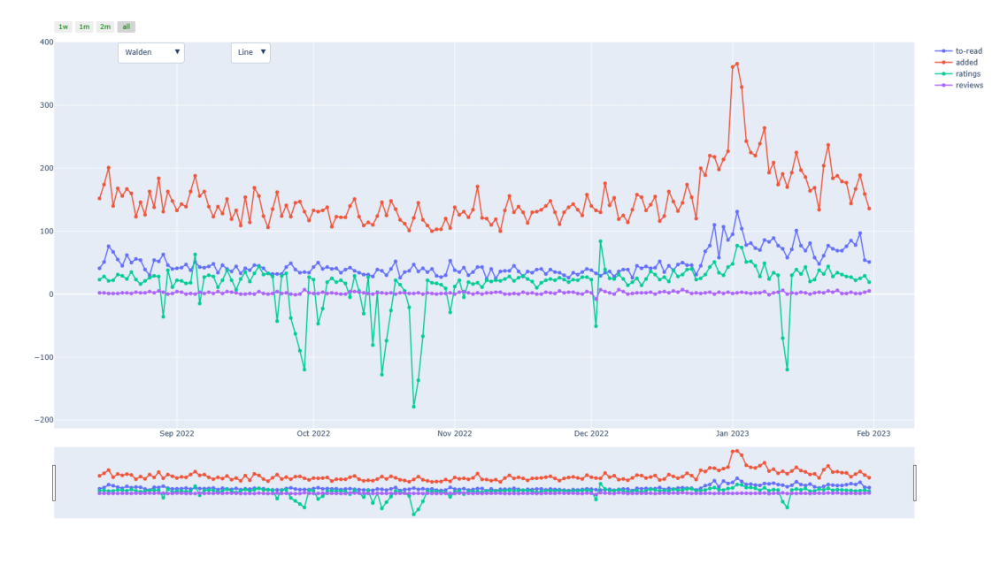

In [4]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

plt.figure(figsize=(20, 12))
img = mpimg.imread('./interactive_plot.png')
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

---

### 2.2.2 &nbsp; Clean book basic infomation dataframe: `df_info`

### `Sub_Genre`

- Note these entries are ***strings***, rather than a list it looks like, so for easier manipulation, we transform them into list of strings

In [5]:
print(df_info['Sub_Genres'][0])
print(len(df_info['Sub_Genres'][0]))  # The length equals to the number of strings

['Biography', 'Art', 'Nonfiction', 'Childrens', 'History', 'African American']
78


#### In this case, we use regular expressions to match the content between single quotes (' ') and turn results into desirable formats

In [6]:
import re

df_info['Sub_Genres'] = df_info['Sub_Genres'].apply(lambda text: re.findall("\'(.*?)\'", text))

In [7]:
# turn genre names into lower case & wanted format as main genres
def process_genre(text_list):
    text_cleaned = []
    for text in text_list:
        text = str.lower(text)
        text = text.replace(' ', '-')
        if text == 'childrens':
            text = 'children-s'
            
        text_cleaned.append(text)
    return text_cleaned

In [8]:
df_info['Sub_Genres'] = df_info['Sub_Genres'].apply(process_genre)
df_info['Sub_Genres'][0]

['biography', 'art', 'nonfiction', 'children-s', 'history', 'african-american']

### `Award`

- The case is a little bit different from before, we can see more messy patterrns, e.g. punctuation (: ' -), different quotations('' ""), varing empty spaces. Therefore, it's hard to write a uniform regular expression to format the strings as wanted

- In this case, we use a more complicated cleansing method as follows:

In [9]:
Award = df_info['Award']

print(Award[0])
print(len(Award[0]))

['Schneider Family Book Award', "Vermont's Picture Book Awards: Red Clover", 'Sibert Medal', "Pennsylvania Young Readers' Choice Award", 'NCTE Orbis Pictus Award']
163


#### Remove punctuation, but keep comma for further separation & turn into lower case to avoid case-sensitive duplicates

In [10]:
from string import punctuation

def remove_punctuation_lower(document):
    keep_comma = punctuation.replace(',', '')
    no_punct = ''.join([character for character in document if character not in keep_comma])
    no_punct_lower = str.lower(no_punct)
    
    return no_punct_lower

In [11]:
Award = Award.apply(remove_punctuation_lower)
Award

0       schneider family book award, vermonts picture ...
1                                                      na
2                                                      na
3                            national book award finalist
4                                                      na
                              ...                        
8027    rhode island teen book award, evergreen teen b...
8028                                                   na
8029    rita award by romance writers of america, dabw...
8030    stonewall book award, romantic times reviewers...
8031    romantic times reviewers choice award rt award...
Name: Award, Length: 8032, dtype: object

#### Split on comma kept from before & turn combined string into separate award tags in a list

In [12]:
def process_award(tags):
    tags_list = tags.split(',')
    cleaned_tags = []
    
    for item in tags_list:
        item = item.strip()
        item = item.replace(' ', '_')
        cleaned_tags.append(item)
    
    # replace 'NA' by 'no' to represent no award has obtained for easier use
    if cleaned_tags == ['na']:
        cleaned_tags = ['no']
    
    return cleaned_tags 

In [13]:
Award = Award.apply(process_award)
Award

0       [schneider_family_book_award, vermonts_picture...
1                                                    [no]
2                                                    [no]
3                          [national_book_award_finalist]
4                                                    [no]
                              ...                        
8027    [rhode_island_teen_book_award, evergreen_teen_...
8028                                                 [no]
8029    [rita_award_by_romance_writers_of_america, dab...
8030    [stonewall_book_award, romantic_times_reviewer...
8031    [romantic_times_reviewers_choice_award_rt_awar...
Name: Award, Length: 8032, dtype: object

In [14]:
df_info['Award'] = Award

###  `Follower_Num`

- Some entries are in the form of thousands (using k), e.g. 13.1k = 13100 in real numbers. We turn them into same format and cast types to int64

In [15]:
df_info['Follower_Num'][18]

'13.1k'

In [16]:
def digit_process(x):
    # some cases, it will be nan
    if pd.isna(x):
        x = 0
    
    if 'k' in str(x):
        x = float(x.split('k')[0])  # ensure if no numeric part, will become xx.0
        x = str(x).replace('.', '')
        x = int(x) * 100
        
    return int(float(x))

In [17]:
df_info['Follower_Num'] = df_info['Follower_Num'].apply(digit_process)
df_info['Follower_Num'][18]

13100

### `Rating_Dist`

In [18]:
df_info['Rating_Dist'][0]

"['1894 (36%)', '1732 (33%)', '866 (16%)', '351 (6%)', '329 (6%)']"

In [19]:
dist = []
for index, row in df_info['Rating_Dist'].iteritems():
    num_list = re.findall("\'(\d*) \(", row)
    dist_temp = []
    for num in num_list:
        num = int(num)
        dist_temp.append(num)
    
    dist.append(dist_temp)

In [20]:
rating_df = pd.DataFrame(data=dist, columns=['Five_Star', 'Four_Star', 'Three_Star', 'Two_Star', 'One_Star'])
rating_df

,Five_Star,Four_Star,Three_Star,Two_Star,One_Star
0,1894,1732,866,351,329
1,3446,2345,1346,395,254
2,368,319,183,41,26
3,3048,3155,1300,257,65
4,1009,745,370,116,73
...,...,...,...,...,...
8027,98525,72444,31529,8655,4489
8028,290631,178031,104512,31718,17670
8029,47584,47758,42149,16365,7316
8030,107186,125723,100191,35006,15149


In [21]:
# drop original rating distribution strings, concatenate cleaned ratings data
df_info.drop(['Rating_Dist'], axis=1, inplace=True)
df_info = pd.concat([df_info, rating_df], axis=1)

### 2.2.3 &nbsp; Clean book reviews dataframe `df_reviews`

### `N_Review`, `N_Follower`

- Similar as before, nan -> 0; change 'k' into thousand; drop suffixes like 'follower', 'like'

In [22]:
print(df_reviews.iloc[9643, 3])
print(df_reviews.iloc[4300, 4])

9,568
1 follower


In [23]:
def digit_process2(x):
    # some cases, it will be nan
    if pd.isna(x):
        x = 0
    
    if 'k' in str(x):
        x = float(x.split('k')[0])  # ensure if no numeric part, will become xx.0
        x = str(x).replace('.', '')
        x = int(x) * 10 ** 2
        
    # some data like '1 follower'
    if 'follower' in str(x):
        x = str(x).split(' follower')[0]
    
    if ',' in str(x):
        x = str(x).replace(',', '')

    return int(x)

In [24]:
df_reviews[['N_Review', 'N_Follower']] = df_reviews[['N_Review', 'N_Follower']].applymap(digit_process2)

print(df_reviews.iloc[9643, 3])
print(df_reviews.iloc[4300, 4])

9568
1


### `N_Likes`, `N_Comments`

In [25]:
def digit_process3(x):
    # some cases, it will be nan
    if pd.isna(x):
        x = 0
    
    if ',' in str(x):
        x = str(x).replace(',', '')
    
    # modify enties in form: '1 like', '1 comment'
    if 'like' in str(x):
        x = str(x).split(' like')[0]
    
    if 'comment' in str(x):
        x = str(x).split(' comment')[0]
    
    # some tricky entry '3.0'
    if '.0' in str(x):
        x = str(x).replace('.0', '')
        
    return int(x)

In [26]:
df_reviews[['N_Likes', 'N_Comments']] = df_reviews[['N_Likes', 'N_Comments']].applymap(digit_process3)

### 2.2.4 &nbsp; Additional tricky cleansings 

### `Author`

- We will drop some entries where *Author_Name* are *Anonymous* / *Unknown*
- One interesting case is **William Shakespeare***, who authored ***12.4k*** books on GoodReads website, we guess this is due to website wrongly classifying all books that written by other authors but with the same name into his lists. In whatever case, we can think of this as outlier to delete it.

In [27]:
df_info[df_info['Author'] == 'William Shakespeare']['Book_Authored'][1474]

'12.4k'

In [28]:
df_info = df_info[df_info['Author'] != 'Anonymous']
df_info = df_info[df_info['Author'] != 'Unknown']
df_info = df_info[df_info['Author'] != 'William Shakespeare']

### `Book_Authored`

- As a result of above cleansing on authors, we can cast `Book_Authored` into int64 type now (otherwise will cause error at '12.4k')

In [29]:
df_info['Book_Authored'] = df_info['Book_Authored'].astype('int64')

### Genre `ebooks`

- It's interesting to find this genre explicitly listed in website, but we think `ebooks` just refers to this book's form, rather than its genre
- To fix this problem, we will use the book's fist entry of sub-genre to replace `ebooks`, keeping original data as much as possible compared to simply deleting all books under this genre

In [30]:
ebook_df = df_info[df_info['Genre'] == 'ebooks']

# replace ebooks's 'Genre' by first entry in sub-genres
for index, row in ebook_df.iterrows():
    ebook_df.loc[index, 'Genre'] = row['Sub_Genres'][0]

ebook_df.head()

,Uid,Title,Author,Genre,Sub_Genres,Rating,Publish_Date,Page_Num,Award,Description,Author_Desc,Book_Authored,Follower_Num,Review_Num,Rating_Num,Five_Star,Four_Star,Three_Star,Two_Star,One_Star
2455,5326,A Christmas Carol,Charles Dickens,fiction,"[fiction, christmas, fantasy, literature, audi...",4.07,"December 17, 1843",104,[audie_award],"'If I had my way, every idiot who goes around ...",Charles John Huffam Dickens was a writer and s...,7525,26800,27683,768718,310564,262704,149159,34464,11827
2456,10572,A Clash of Kings,George R.R. Martin,fiction,"[fiction, epic-fantasy, science-fiction-fantas...",4.41,"November 16, 1998",969,"[nebula_award, locus_award, premio_ignotus]",A comet the color of blood and flame cuts acro...,"George Raymond Richard ""R.R."" Martin was born ...",1145,105000,26091,879504,476711,309301,78414,10971,4107
2457,13497,A Feast for Crows,George R.R. Martin,fiction,"[fiction, epic-fantasy, science-fiction-fantas...",4.15,"October 17, 2005",1061,"[hugo_award, locus_award]","Crows will fight over a dead man's flesh, and ...","George Raymond Richard ""R.R."" Martin was born ...",1145,105000,23219,693819,292944,248100,123621,23880,5274
2458,13496,A Game of Thrones,George R.R. Martin,fiction,"[fiction, epic-fantasy, adult, high-fantasy, s...",4.44,"August 6, 1996",835,"[nebula_award, locus_award, world_fantasy_awar...","alternate cover editions can be found here, he...","George Raymond Richard ""R.R."" Martin was born ...",1145,105000,59804,2325952,1428484,625526,183860,49380,38702
2459,18774964,A Man Called Ove,Fredrik Backman,contemporary,"[contemporary, audiobook, humor, adult, book-c...",4.37,"August 27, 2012",337,[no],A grumpy yet loveable man finds his solitary w...,Fredrik Backman is the #1 New York Times bests...,27,59100,91891,854074,472832,264864,87444,20543,8391


In [31]:
df_info[df_info['Genre'] == 'ebooks'] = ebook_df

#### One subsequent problem is that, sometimes the first entry in sub-genres does not exist in our 39 genres (40 drop 'ebooks'), so we delete them

In [32]:
genre_names = df_info['Genre'].unique()

# record Uid of types not existing in 40 genres
no_type_uid = []
for index, row in ebook_df.iterrows():
    if row['Genre'] not in genre_names:
        no_type_uid.append(row['Uid'])

In [33]:
df_info = df_info[~df_info['Uid'].isin(no_type_uid)].reset_index(drop=True)

#### After turning books previously belonging to  `ebooks` into other genres, we might cause some duplicates
- i.e. Some books might have already been crawled under other genres

In [34]:
# use ['Title', 'Author', 'Genre'] as a composite key to drop duplicates

df_info = df_info.drop_duplicates(subset=['Title', 'Author', 'Genre']).reset_index(drop=True)

#### Number of Books: 8032 --> 7781 (reduced)

In [35]:
df_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7858 entries, 0 to 7857
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Uid            7858 non-null   int64  
 1   Title          7858 non-null   object 
 2   Author         7858 non-null   object 
 3   Genre          7858 non-null   object 
 4   Sub_Genres     7858 non-null   object 
 5   Rating         7858 non-null   float64
 6   Publish_Date   7858 non-null   object 
 7   Page_Num       7858 non-null   int64  
 8   Award          7858 non-null   object 
 9   Description    7849 non-null   object 
 10  Author_Desc    7374 non-null   object 
 11  Book_Authored  7858 non-null   int64  
 12  Follower_Num   7858 non-null   int64  
 13  Review_Num     7858 non-null   int64  
 14  Rating_Num     7858 non-null   int64  
 15  Five_Star      7858 non-null   int64  
 16  Four_Star      7858 non-null   int64  
 17  Three_Star     7858 non-null   int64  
 18  Two_Star

#### Correspondingly, we should modify our book review dataset

In [36]:
Uid = df_info['Uid'].values

# only keep books with Uid left in dataset
df_reviews = df_reviews[df_reviews['Uid'].isin(Uid)]
df_reviews = df_reviews.drop_duplicates(subset=['Uid', 'Title', 'Reviewer']).reset_index(drop=True)

#### Number of Book reviews: 118622 --> 80461 (reduced)

In [37]:
df_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80777 entries, 0 to 80776
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Uid            80777 non-null  int64 
 1   Title          80777 non-null  object
 2   Reviewer       80777 non-null  object
 3   N_Review       80777 non-null  int64 
 4   N_Follower     80777 non-null  int64 
 5   Review_Rating  80777 non-null  int64 
 6   Review_Date    80777 non-null  object
 7   Content        80777 non-null  object
 8   N_Likes        80777 non-null  int64 
 9   N_Comments     80777 non-null  int64 
dtypes: int64(6), object(4)
memory usage: 6.2+ MB


#### Store the final cleaned datasets

In [38]:
df_info.to_csv('./Book_info_cleaned.csv', index=False)
df_reviews.to_csv('./Book_reviews_cleaned.csv', index=False)

---

## Part 3)  &nbsp; Data visualization 

#### Since data cleansing part requires enormous original source of data, we recommend to run Jupyter notebook from here to see visualization

In [39]:
# read cleaned CSV for use
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df_info = pd.read_csv('Book_info_cleaned.csv')
df_info.head()

,Uid,Title,Author,Genre,Sub_Genres,Rating,Publish_Date,Page_Num,Award,Description,Author_Desc,Book_Authored,Follower_Num,Review_Num,Rating_Num,Five_Star,Four_Star,Three_Star,Two_Star,One_Star
0,13642600,A Splash of Red The Life and Art of Horace Pippin,Jen Bryant,art,"['biography', 'art', 'nonfiction', 'children-s...",3.87,"January 8, 2013",34,"['schneider_family_book_award', 'vermonts_pict...","As a child in the late 1800s, Horace Pippin lo...",Jen Bryant (Jennifer Fisher Bryant) writes pic...,32,90,738,5172,1894,1732,866,351,329
1,470185,About Looking,John Berger,art,"['nonfiction', 'photography', 'philosophy', 'e...",4.07,"January 1, 1980",224,['no'],NaN,"John Peter Berger was an English art critic, n...",154,1892,146,7786,3446,2345,1346,395,254
2,137933,After the End of Art Contemporary Art and the ...,Arthur C. Danto,art,"['philosophy', 'nonfiction', 'art-history', 't...",4.03,"January 1, 1997",264,['no'],"Over a decade ago, Arthur Danto announced that...",Arthur C. Danto was Johnsonian Professor Emeri...,129,138,35,937,368,319,183,41,26
3,52374,Against Interpretation and Other Essays,Susan Sontag,art,"['nonfiction', 'philosophy', 'art', 'criticism...",4.13,"January 1, 1966",312,['national_book_award_finalist'],Against Interpretation was Susan Sontag's firs...,Susan Sontag was born in New York City on Janu...,204,3577,450,7825,3048,3155,1300,257,65
4,140987,Air Guitar Essays on Art and Democracy,Dave Hickey,art,"['nonfiction', 'essays', 'music', 'criticism',...",4.08,"August 2, 1997",208,['no'],"The 23 essays (or ""love songs"") that make up t...",David Hickey (born circa 1939) is an American ...,98,62,148,2313,1009,745,370,116,73


#### Data pre-processing before using `df_info` dataframe

- Because the list-type data are stored as *strings*, we need to turn them back to the correct data type.

In [40]:
from ast import literal_eval

df_info['Sub_Genres'] = df_info['Sub_Genres'].apply(lambda x: literal_eval(x) if "[" in x else x)
df_info['Award'] = df_info['Award'].apply(lambda x: literal_eval(x) if "[" in x else x)

### 3.1 &nbsp; Rating across genres visualization

- We first become interested in the books ratings, the most important numerical measurement for a book's quality.
- We will first take a glance at features associated with *Ratings* across genres

In [41]:
# Extract important numerical features with genres
df_info_category_extract = df_info[['Genre','Rating','Review_Num','Rating_Num','Five_Star','Four_Star','Three_Star','Two_Star','One_Star']]

# Compute the average statistics for each genre
df_info_category = df_info_category_extract.groupby(['Genre'], as_index=False).mean()
df_info_category.head()

,Genre,Rating,Review_Num,Rating_Num,Five_Star,Four_Star,Three_Star,Two_Star,One_Star
0,art,4.069769,1275.388462,39824.523077,16238.476923,12387.492308,7366.146154,2326.323077,1506.084615
1,biography,4.076782,7315.908046,166267.844828,74920.919540,53651.896552,26019.505747,7291.551724,4383.971264
2,business,4.045792,2599.091667,58318.412500,23423.000000,20083.579167,10572.491667,2836.837500,1402.504167
3,chick-lit,3.806413,9547.461883,245806.363229,93630.493274,76293.089686,50110.107623,16367.058296,9405.614350
4,children-s,4.132278,9372.234875,373521.085409,193140.629893,107352.907473,54106.427046,12862.943060,6058.177936


### 3.1.1  &nbsp; Average Rating v.s. Genre

- We first examined the average ratings of different genres to grasp a big picture of book ratings. 

In [42]:
# Average Rating v.s. Genre
import plotly.express as px
import plotly.io as pio

fig = px.scatter(df_info_category, y="Rating", x="Genre")
fig.update_layout(title='Average Rating v.s. Genre', title_x = 0.5)
fig.update_traces(marker_size=10)

fig.show()

We can observe that:
- The majority of the scores fall between 3.9 and 4.2; Generally we would say the differences of book average ratings across genres are not very large.
- While we surely can observe some extreme points, for example, ***Manga*** has the highest average score - 4.36, and ***chick-lit*** has the lowest average score - 3.81; These two genres have relatively higher/lower (in current scale) average ratings than others. 
- The possible reasons might be their speciality in content and target audience. For example, ***manga*** is a book format more focused on pictures rather than texts, and its audience could be more narrowed to a centain group of fans, let alone the users who take time to purposely leave comments on the website. This might be a potential cause for its high average rating.

### 3.1.2 &nbsp; Rating Distribution v.s. Genre

For *Ratings*, we would like to take a deeper look at its inner distributions across genres. 
- This is actually to examine the ***Simpon's paradox***, which concerns about the overall trend will be overturned when dividing into sub-populations

In [43]:
# Compute percentages for each rating level

df_info_category['Five_Star_Percentage'] = df_info_category['Five_Star']/ df_info_category['Rating_Num'] * 100
df_info_category['Four_Star_Percentage'] = df_info_category['Four_Star']/ df_info_category['Rating_Num'] * 100
df_info_category['Three_Star_Percentage'] = df_info_category['Three_Star']/ df_info_category['Rating_Num'] * 100
df_info_category['Two_Star_Percentage'] = df_info_category['Two_Star']/ df_info_category['Rating_Num'] * 100
df_info_category['One_Star_Percentage'] = df_info_category['One_Star']/ df_info_category['Rating_Num'] * 100

In [44]:
fig_Rating_Breakdown= px.bar(df_info_category, y="Genre", 
                             x=["Five_Star_Percentage", "Four_Star_Percentage", 
                                "Three_Star_Percentage", "Two_Star_Percentage", "One_Star_Percentage"], 
                            width=900, height=700)
fig_Rating_Breakdown.update_layout(title_text= 'Rating Distributions across Genres', xaxis_title = 'Percentage', title_x=0.5 )
fig_Rating_Breakdown.show()

The plot above shows the percentages of different scores for each genre. The ratings of most genres roughly have a distribution of  

*   5 stars: 40%
*   4 stars: 30%
*   3 stars: 20%
*   1~2 stars: 10%

But we can also see some better performed genres, for example, ***manga*** has roughly 56% five star ratings, and more than 80% users rate this genre's books no lower than 4 stars, whch coincides with the above overall trend of manga's average ratings.

### 3.1.3 &nbsp; Average rating across publish years

-  We are also interested in whether exists some chronological average rating differences, i.e. whether there exist some particular years that have significantly different average ratings compared to others, or maybe some yearly cycles
- This might also serve as an indicator that whether our dataset is balanced or not

In [45]:
import re

# split Year information from publish date
df_info['Year'] = df_info['Publish_Date'].apply(lambda x: int(re.findall(', (.*)', x)[0]))

In [46]:
rating_yearly = df_info[['Year', 'Rating']].sort_values(by='Year').reset_index(drop=True)
df_info.drop(['Year'], axis = 1, inplace=True)
rating_yearly

,Year,Rating
0,2,4.42
1,8,4.08
2,8,4.08
3,20,3.86
4,20,3.86
...,...,...
7853,2022,4.09
7854,2022,3.27
7855,2023,4.11
7856,2023,4.10


#### Very few books were published before year 1750 (actually more likely to be some classics, e.g. the Bible) 

In [47]:
len(rating_yearly[(rating_yearly['Year'] < 1750)])

154

#### Since these books' publish years are extremely inbalanced, we need to set some time interval bins for better visualization

In [48]:
# split time horizon into some inner-densed time intervals, but sparse in an overview
bins = []
bins.extend(list(np.linspace(1750, 1900, 10, dtype='int64')))
bins.extend(list(np.linspace(1900, 1990, 11, dtype='int64')))
bins.extend(list(np.linspace(1990, 2000, 6, dtype='int64')))
bins.extend(list(np.linspace(2000, 2023, 24, dtype='int64')))

# remove duplicated time nodes
bins.remove(1900)
bins.remove(1990)
bins.remove(1990)
bins.remove(2000)

#### We can observe that around 1980~1990, these ten years have the most books in this time interval, the yearly book number after 2000 are roughly balanced with other intervals before 1980, so we can conclude this is generally a reasonable split of time intervals

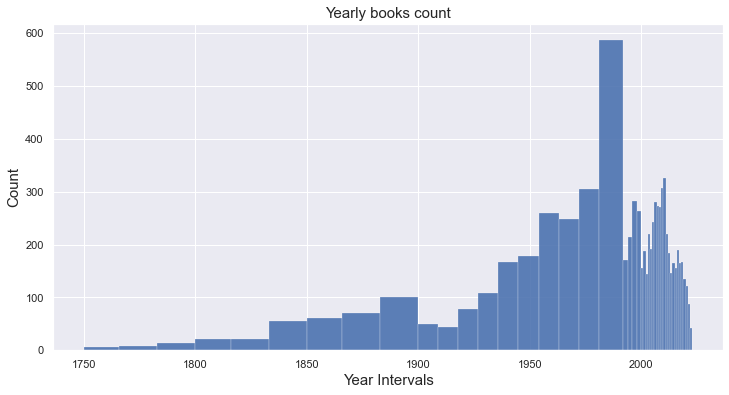

In [49]:
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.set(style="darkgrid")
sns.histplot(data = rating_yearly, x = 'Year', bins=bins, alpha=0.9)
plt.title('Yearly books count', fontsize=15)
plt.xlabel('Year Intervals', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.show()

In [50]:
# put publish year into intervals
bins.insert(0, 0)
interval = pd.cut(rating_yearly['Year'], bins=bins, duplicates='drop', include_lowest=True).values

rating_year_group = pd.DataFrame({"YearInterval": interval,
                                  "Rating": rating_yearly['Rating'].values})

In [51]:
rating_year_group

,YearInterval,Rating
0,"(-0.001, 1750.0]",4.42
1,"(-0.001, 1750.0]",4.08
2,"(-0.001, 1750.0]",4.08
3,"(-0.001, 1750.0]",3.86
4,"(-0.001, 1750.0]",3.86
...,...,...
7853,"(2021.0, 2022.0]",4.09
7854,"(2021.0, 2022.0]",3.27
7855,"(2022.0, 2023.0]",4.11
7856,"(2022.0, 2023.0]",4.10


In [52]:
# group by interval to calculate average ratings

temp_df = rating_year_group.groupby(by='YearInterval', as_index=False).mean()

bins.remove(0)
temp_df['YearInterval'] = bins  # modify bin names for better display

#### Plot average ratings of books v.s. time intervals

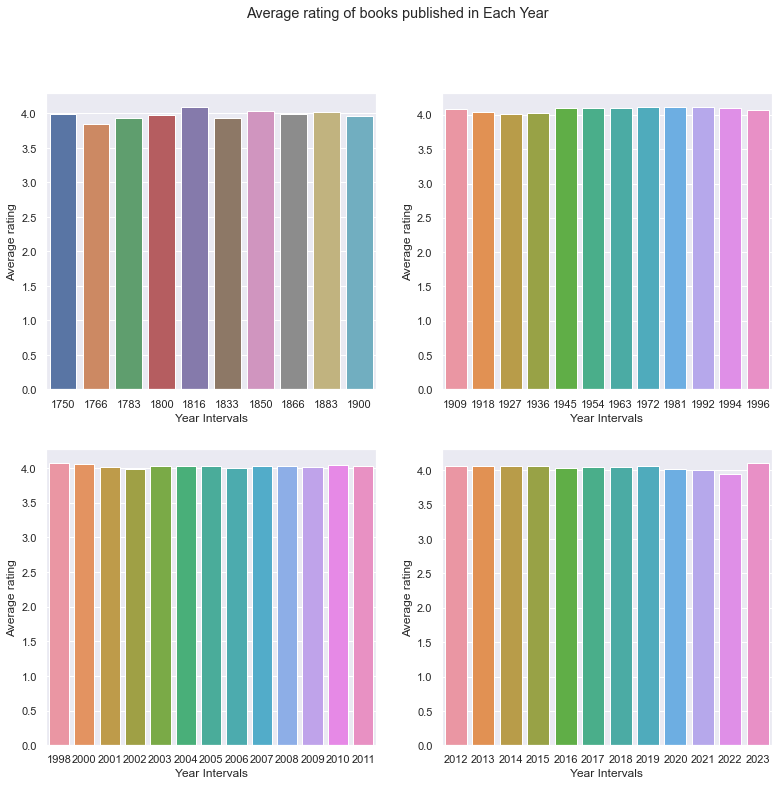

In [53]:
plt.figure(figsize=(13, 12))
plt.suptitle("Average rating of books published in Each Year")

plt.subplot(2, 2, 1)
sns.barplot(data = temp_df[0:10], x = 'YearInterval', y = 'Rating')
plt.xlabel('Year Intervals')
plt.ylabel('Average rating')

plt.subplot(2, 2, 2)
sns.barplot(data = temp_df[10:22], x = 'YearInterval', y = 'Rating')
plt.xlabel('Year Intervals')
plt.ylabel('Average rating')

plt.subplot(2, 2, 3)
sns.barplot(data = temp_df[22:35], x = 'YearInterval', y = 'Rating')
plt.xlabel('Year Intervals')
plt.ylabel('Average rating')

plt.subplot(2, 2, 4)
sns.barplot(data = temp_df[35:47], x = 'YearInterval', y = 'Rating')
plt.xlabel('Year Intervals')
plt.ylabel('Average rating')

plt.show()

In general, we cannot observe any yearly cycle or chronological differences on book average ratings, which also indicates that our dataset has a balanced distribution across time intervals, thus can provide more comprehensive recommendations for users 

### 3.2 &nbsp; Rating/Review Number vs Genre

In addition to ratings, another important numerical features in our dataset are the ***Rating numbers*** and ***Review numbers*** (i.e. how many users write a reivew/rate this book). These two features can indicate the **popularity** (or trend) of the book among readers, thus very important for book recommendations.

*(Their difference is that for a review, users need to have textual comments, but rating only requires users to rate books in stars.)*

So we will take a look at the plots of the average rating numbers and review numbers across genres.

In [54]:
# Average rating number for each Genre

fig_Rating_Num = px.scatter(df_info_category, x="Genre", y="Rating_Num")
fig_Rating_Num.update_layout(title_text = 'Average Rating Numbers v.s. Genre', title_x=0.5)
fig_Rating_Num.update_traces(marker_size=10)
fig_Rating_Num.show()

# Average review number for each genre
fig_Review_Num = px.scatter(df_info_category, x="Genre", y="Review_Num")
fig_Review_Num.update_layout(title_text = 'Average Review Numbers v.s Genre', title_x=0.5)
fig_Review_Num.update_traces(marker_size=10)
fig_Review_Num.show()

- We can see that these two graphs have pretty similar distributions, except for several extreme points. 

- ***Fiction*** is the most outstanding genre in average rating and reviews' numers, which to some extent proves its popularity among readers on the wesite;

- ***young-adult***, ***romance*** are the following two genres that more favored to rating/review volume, while ***contemporary*** books have the top 3 review numbers but lower rating numbers, which is interesting to see this inconsistency and might needs further analysis.

- The top 5 least reviewed/rated genres are ***Cookbooks, Manga, Art, Music, and Sports***. 
    - Among them, we can notice that except for ***manga***, all others are more focused on practicability, that maybe explaining the reason of less reviewed/rated, since they have less literal meanings for book lovers;
    - We notice that the genre ***manga*** has the highest rating, but it is also among the least rated/reviewed genres, so we wanted to further explore whether there is a correlation between the ratings and the review/rating numbers. 

### 3.3 &nbsp; Rating v.s. Review/Rating Number across genres

### 3.3.1 &nbsp; Rating v.s. Review Number group by genres

We first visualized the ***review number*** vs ***rating*** in a bubble chart. The size of each bubble is the review number.

In [55]:
# Review Number vs Ratings

fig_Review_Num_Rate = px.scatter(df_info_category, x="Rating", y="Review_Num", size="Review_Num", 
                                 color="Genre", hover_name="Genre", size_max=60)
fig_Review_Num_Rate.update_layout(title_text = 'Review Number v.s. Rating across Genres', title_x=0.5)
fig_Review_Num_Rate.show()

We found that there is no obvious relationship between them, but in general we can observe that:
- If the book genre has more reviews, it tends to have less extreme ratings. (e.g. ***fiction, romance, contemporary***)
- We notice that ***manga*** has very high average rating and much less review number, this might be summarized as the characteristics of the audience of this genre's books.

### 3.3.2 &nbsp; Rating v.s. Rating Number group by genres

Then we visualize ***rating numbers*** vs ***ratings*** in histograms. These graphs illusrated the distribution of ratings versus number of ratings it received for each genre as well as the distribution of different genres given a specific rating.

In [56]:
# Ratings Number vs Ratings

fig = px.histogram(df_info, x="Rating", y="Rating_Num", color="Genre", marginal="violin",
                   hover_data=["Genre", "Rating"], nbins=80, width=900, height=900)
fig.update_layout(margin=dict(l=20, r=20, t=25, b=20), title_text = 'Rating Num v.s. Rating across Genres', title_x = 0.5)
fig.show()

In general, each genre books are more likely to receive the majority of their review numbers centered at their average rating, which means the opinions of users are overall concentrated, no large inconsistencies are observed (that's why the histogram looks like a bell shape, centered at average ratings).

But we can also see some discrepencies in certain genres, for example, ***paranormal*** has more diverse distribution of rating numbers against ratings, but was hidden before due to averaging effects, these in-depth findings will be helpful for our future analysis.

---

### 3.4 &nbsp; Award across genres visualization

There are many literary awards, which help readers to select high-quality books. In this section, we study the genre distribution of award-winning books to understand the general trend and potential preference for different awards. This analysis helps provide guidance for the selection of books based on awards across genres in our recommendation system.

#### We first store all award names in a set and build a dataframe to conduct one-hot encoding of award-wining for each book

- 1 means wining this award, 0 means not

In [57]:
award_set = set([])
for index, award_list in df_info['Award'].items():
    award_set.update(award_list)

In [58]:
print("There are in total",len(award_set),"different awards in our dataset.")

There are in total 820 different awards in our dataset.


#### One-hot encoding for award-winning

In [59]:
# first build a format dataframe

award_df = pd.DataFrame(columns = award_set)
award_df = award_df.sort_index(axis = 1)
award_df

,aaassubaru_sbu0026f_prize_for_excellence_in_science_books,acfw_carol_award,agatha_award,akutagawa_prize_芥川龍之介賞,ala_alex_award,ala_notable_childrens_book_award,alabama_author_award,alabama_library_association_childrens_book_of_the_year,alan_paton_award,alcs_dagger_for_nonfiction,...,премія_імені_максима_рильського,إمبيرتو,جائزة_الدولة_التشجيعية_في_الفلسفة_لعام,جایزه_ادبی_مهرگان,دار_المنى,لاکu200cپشت_پرنده,このミステリーがすごい！,小林秀雄賞,日本推理作家協会賞,本屋大賞


In [60]:
award_data = np.zeros((len(df_info['Award']), len(award_set)))

for index, award_list in df_info['Award'].items():
    for award in award_list:
        # if award exists in this book's award entry, we retrieve its index and put '1' to encode
        if award in list(award_df.columns):
            col_index = list(award_df.columns).index(award)
            award_data[index, col_index] = 1

In [61]:
award_count = pd.DataFrame(award_data, columns = award_df.columns, dtype='int64')
award_count.head()

,aaassubaru_sbu0026f_prize_for_excellence_in_science_books,acfw_carol_award,agatha_award,akutagawa_prize_芥川龍之介賞,ala_alex_award,ala_notable_childrens_book_award,alabama_author_award,alabama_library_association_childrens_book_of_the_year,alan_paton_award,alcs_dagger_for_nonfiction,...,премія_імені_максима_рильського,إمبيرتو,جائزة_الدولة_التشجيعية_في_الفلسفة_لعام,جایزه_ادبی_مهرگان,دار_المنى,لاکu200cپشت_پرنده,このミステリーがすごい！,小林秀雄賞,日本推理作家協会賞,本屋大賞
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


#### In order to provide a more representative result, we focus on the Top 20 prestigious awards based on the record numbers of awards. 
- Below is a list of the Top 20 popular awards after **excluding the no-award** books.

In [62]:
award_series = award_count.sum().sort_values(ascending=False)[1:21]
award_series

goodreads_choice_award                     391
locus_award                                295
lincoln_award                              268
audie_award                                262
national_book_critics_circle_award         191
pulitzer_prize                             163
los_angeles_times_book_prize               141
anthony_award                              131
national_book_award_finalist               129
hugo_award                                 124
gateway_readers_award                      112
rhode_island_teen_book_award               110
pennsylvania_young_readers_choice_award    108
vermont_golden_dome_book_award             108
edgar_award                                100
national_book_award                         92
puddly_award                                91
south_carolina_book_award                   90
book_sense_book_of_the_year_award           88
ala_alex_award                              88
dtype: int64

### 3.4.1 &nbsp; Genre Distribution in Awards

- Among the selected Top 20 awards, we  first summarize the genres of the award-winning books to examine award preference in general.
- Also we calculated the total number of awards each genre wins

In [63]:
df_award = pd.concat([df_info[['Genre']], award_count[award_series.index[1:].values]], axis=1)
award_genre = df_award.groupby('Genre').sum().reset_index()
award_genre.head()

,Genre,locus_award,lincoln_award,audie_award,national_book_critics_circle_award,pulitzer_prize,los_angeles_times_book_prize,anthony_award,national_book_award_finalist,hugo_award,gateway_readers_award,rhode_island_teen_book_award,pennsylvania_young_readers_choice_award,vermont_golden_dome_book_award,edgar_award,national_book_award,puddly_award,south_carolina_book_award,book_sense_book_of_the_year_award,ala_alex_award
0,art,1,1,0,8,1,2,0,2,1,1,1,2,2,4,2,1,0,5,1
1,biography,1,7,14,20,21,12,0,7,1,0,0,1,0,0,7,9,0,2,4
2,business,0,0,7,2,0,2,0,0,0,0,0,0,0,0,0,0,0,1,0
3,chick-lit,1,13,3,0,0,0,3,0,0,10,4,5,0,1,0,4,5,2,2
4,children-s,9,2,16,0,0,1,1,6,4,1,4,16,42,1,6,1,7,9,0


In [64]:
total_awards = pd.DataFrame({'Genre': award_genre['Genre'],
                                                 'Total_Awards': award_genre.iloc[:,1:].sum(axis=1)})
total_awards.head()

,Genre,Total_Awards
0,art,35
1,biography,106
2,business,12
3,chick-lit,53
4,children-s,126


#### Plot total number of awards that each genre wins as a pie plot

In [65]:
import plotly.express as px

fig = px.pie(total_awards, values='Total_Awards', names='Genre', title='Awards Distribution across Genres in Top 20 Awards')
fig.update_traces(textposition='inside', hole=0.3)

fig.update_layout(margin=dict(l=0, r=0, t=25, b=15), 
                      uniformtext_minsize=20,
                      uniformtext_mode='hide',
                      height=500, width=800,
                      title_x=0.2)
fig.show()

The pie chart provides an overview of the awards in terms of genres. We can observe the following findings:
- ***Fiction, young-adult, science fiction*** are the most popular award-winning genres. 
- ***Spirituality, cookbooks and manga***, on the other hand, generally have the least chance of winning awards.

One possible reason here is that the famous literary awards are more likely to select the first 3 genres' books, especially fiction novels, while cookbooks and manga more tend to have stronger practicality and be famous on the genreal public but hard to convey literary meanings to win an award.

### 3.4.2 &nbsp; Genre Distributions in *Individual* Award

- In addition to an overview of the award winning frequencies across genres, we also examine the distribution of genres in ***individual*** award seperately, taking into account the different criteria and preferences that may cause different effects.
- This is to examine the ***Simpon's paradox***, which concerns about the overall trend will be overturned when dividing into sub-populations

In [66]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

award_names = list(award_genre.columns.values[1:])

specs = [[{'type':'domain'}] * 3] * 7
fig = make_subplots(rows=7, cols=3, specs=specs, subplot_titles=award_names)

def col_num(x):
    if x % 3 == 0:
        return 3
    else:
        return x % 3

def row_num(x):
    if x % 3 == 0:
        return x // 3
    else:
        return x // 3 + 1
    
for i in award_names:
    index = award_names.index(i) + 1
    fig.add_trace(go.Pie(labels = award_genre['Genre'], values=award_genre[i], name=i), row=row_num(index), col=col_num(index))

    fig.update_traces(textposition='inside')
    fig.update_layout(margin=dict(l=0, r=50, t=20, b=15),
                      height=1800, width=1000,
                      uniformtext_minsize=10,
                      uniformtext_mode='hide',
                      title_x=0.5)

fig.show()

The Pie chart above shows the individual genre distribution of award-winning books in the top 20 popular awards. The following are our findings:

- Some awards are close to evenly distributed among all genres, such as the ***Good Read Choice Award***. This type of award is designed to seperately select the best books in different genres, with the goal of providing recommendations based on readers' own preference for genre.

- On the other hand, some awards focus on selecting books in a specific genre. For example, ***the Hugo Award*** puts a high weight on science fictions. This kind of award can be viewed as the difinitive guide to a particular type of books.

- In summary, with the understanding of award distribution in the genres, we can make more accurate predictions about future awards and improve our recommendation system if users use awards as a guide to their choices.

---

## Part 4) &nbsp; Exploratory Data Analysis

### 4.1 &nbsp; Check duplicates & Null-type data

#### Check no duplicated entries

In [68]:
df_info = pd.read_csv('./Book_info_cleaned.csv')
df_info.duplicated().sum()

0

#### Check null type data 
- It means we have 9 books without description and 484 authors without descriptions, possibly due to reasons like unknown and anonymous authors, or some religious books that cannot be located to a specific author
- Fortunately, these two features do not affect too much about our future analysis, we might simply replace these values by ***'Missing'*** as a placeholder

In [69]:
df_info.isnull().sum()

Uid                0
Title              0
Author             0
Genre              0
Sub_Genres         0
Rating             0
Publish_Date       0
Page_Num           0
Award              0
Description        9
Author_Desc      484
Book_Authored      0
Follower_Num       0
Review_Num         0
Rating_Num         0
Five_Star          0
Four_Star          0
Three_Star         0
Two_Star           0
One_Star           0
dtype: int64

### 4.2 &nbsp; Basic statistics

In [70]:
df_info.describe().round(2)

,Uid,Rating,Page_Num,Book_Authored,Follower_Num,Review_Num,Rating_Num,Five_Star,Four_Star,Three_Star,Two_Star,One_Star
count,7858.00,7858.00,7858.00,7858.00,7858.00,7858.00,7858.00,7858.00,7858.00,7858.00,7858.00,7858.00
mean,8927874.39,4.05,350.45,403.52,29099.16,9283.88,242469.71,107392.63,77143.26,40738.73,11449.72,5745.36
std,15031612.88,0.22,189.52,1001.94,96519.23,17076.16,623709.83,326199.18,180826.60,93190.98,31361.85,22267.12
min,1.00,2.72,1.00,1.00,0.00,11.00,238.00,131.00,38.00,12.00,4.00,0.00
25%,33724.00,3.91,240.00,27.00,897.00,921.75,15137.25,5804.25,5045.25,2662.75,636.00,255.00
50%,294143.00,4.06,320.00,77.00,4305.00,3016.50,56429.00,21315.50,19652.00,10249.50,2389.00,961.00
75%,11468377.00,4.20,416.75,246.00,19200.00,9816.25,188644.75,73601.50,64222.75,35485.25,8842.00,3580.00
max,75275383.00,4.82,2700.00,8956.00,811000.00,190928.00,9113140.00,5914304.00,2371834.00,1253100.00,637337.00,615689.00


- For descriptive statistics, ***Page_Num, Book_Authored, Review_Num, Rating_Num***, the difference between the 50% quantile and 75% quantile of several features are quite different from the difference between 75% quantile and max, so there may be ***outliers***. 

- We use box plots & violin plots to visualize outliers for most indicator ***Rating*** in different genres as following.

### Boxplot for ratings across different genres

- From the box plots of 40 genres, there are some small differences in the mean rating of different groups and the highest average rating genre is ***manga***, which are consistent with our previous observations.

- Apart from that, surely some outliers exist in most genres, in detail,  nearly 80% of genres have outliers for their ***Rating*** and only 7 genres perform perfectly from this persepective. We would say most are acceptable, but genres like ***chick-lit***, ***horror*** and ***psychology*** have more serious outlier problems, we will tackle them correspondingly.

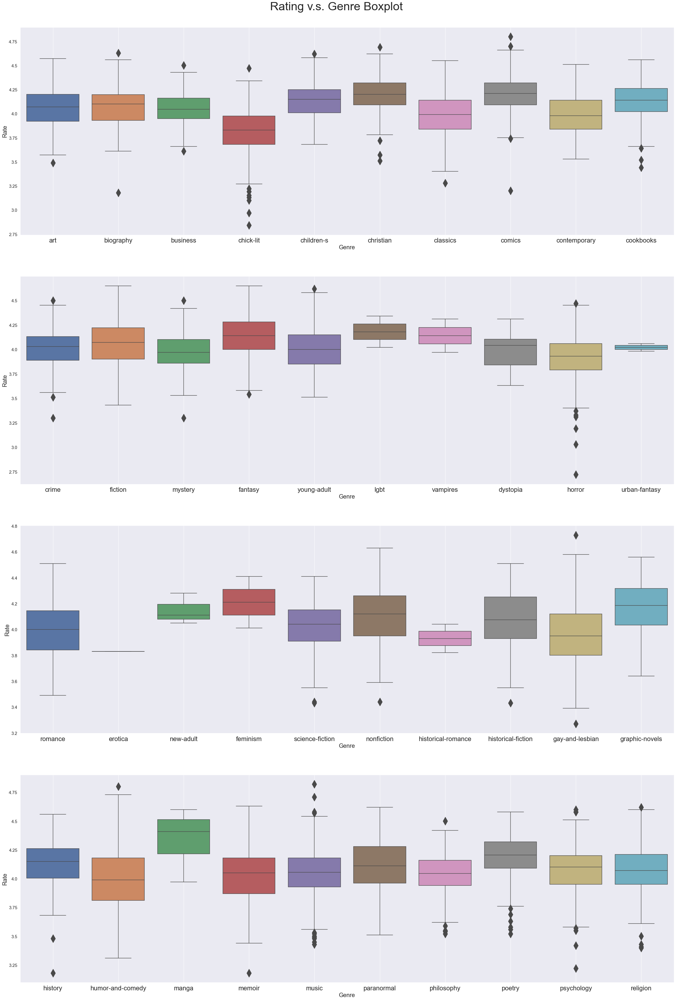

In [72]:
import warnings
warnings.simplefilter('ignore')

genre_names = df_info['Genre'].unique()
point = [9, 19, 29, 39]

plt.figure(figsize = (40, 60))
plt.suptitle('Rating v.s. Genre Boxplot', fontsize=40, x=0.5, y=0.9)

for i in point:
    # plt.suptitle('Rating v.s. Genre Boxplot', fontsize=40)
    index = point.index(i) + 1
    temp_df = df_info[df_info['Genre'].isin(genre_names[i - 9 : i + 1])]
    
    plt.subplot(4, 1, index)
    ax = plt.gca()
    sns.set(font_scale = 2)
    a = sns.boxplot(temp_df['Genre'], temp_df['Rating'], fliersize=20)
    a.set_yticklabels(a.get_yticks(), size = 15)
    plt.grid()
    # temp_df.boxplot(column = 'Rate', by='Genre', ax=ax, fontsize=20)
    # plt.title('Rating v.s. Genre Boxplot', fontsize=30)
    plt.xlabel('Genre', fontsize=20)
    plt.ylabel('Rate', fontsize=20)

### Violin plot for ratings across genres

- From the violin plots, we can better observe the genre rating distributions. In general, the ***Rating*** data for most genres are concentrated.
-  Note that if data have outliers between 25% and 75% quantiles, its range will become significantly wider with long tails. Therefore, we can see similar results as box plots before.

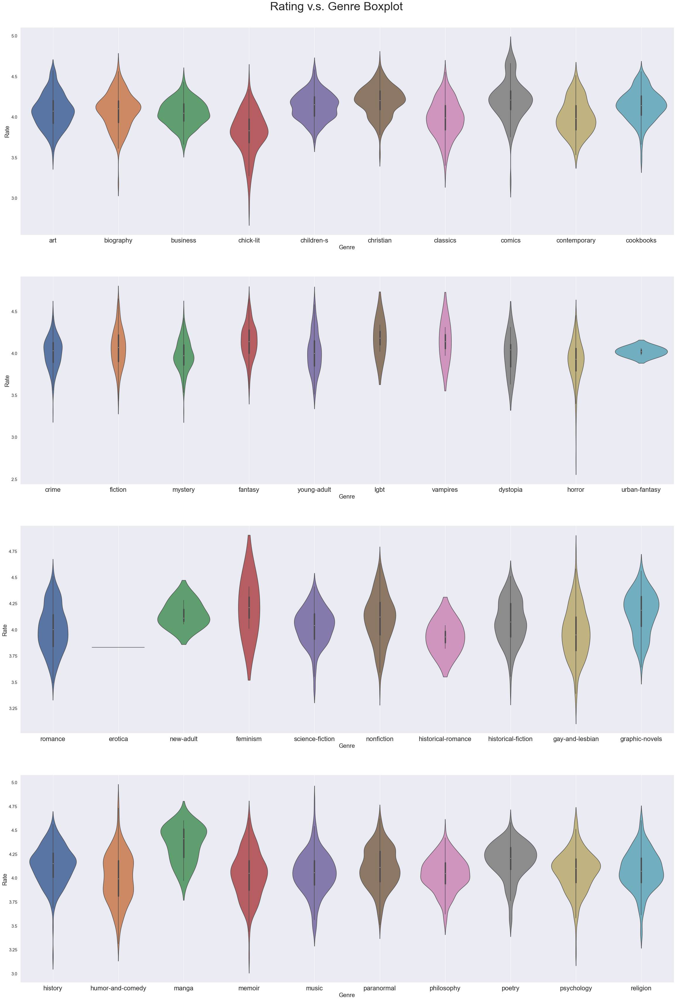

In [74]:
genre_names = df_info['Genre'].unique()
point = [9, 19, 29, 39]

plt.figure(figsize = (40, 60))
plt.suptitle('Rating v.s. Genre Boxplot', fontsize=40, x=0.5, y=0.9)

for i in point:
    # plt.suptitle('Rating v.s. Genre Boxplot', fontsize=40)
    index = point.index(i) + 1
    temp_df = df_info[df_info['Genre'].isin(genre_names[i - 9 : i + 1])]
    
    plt.subplot(4, 1, index)
    ax = plt.gca()
    sns.set(font_scale = 2)
    a = sns.violinplot(temp_df['Genre'], temp_df['Rating'], fliersize=20)
    a.set_yticklabels(a.get_yticks(), size = 15)
    plt.grid()
    # temp_df.boxplot(column = 'Rate', by='Genre', ax=ax, fontsize=20)
    # plt.title('Rating v.s. Genre Boxplot', fontsize=30)
    plt.xlabel('Genre', fontsize=20)
    plt.ylabel('Rate', fontsize=20)

### 4.3 &nbsp; Correlation & Heatmap

- Since different books have different volume of ratings number, it is more reasonable to look at the percentage of each rating category rather than the real rating number. So we first compute the rating percentages as follows:

In [75]:
df_info['Five_star_percent'] =  df_info['Five_Star'] / df_info['Rating_Num']
df_info['Four_star_percent'] =  df_info['Four_Star'] / df_info['Rating_Num']
df_info['Three_star_percent'] =  df_info['Three_Star'] / df_info['Rating_Num']
df_info['Two_star_percent'] =  df_info['Two_Star'] / df_info['Rating_Num']
df_info['One_star_percent'] =  df_info['One_Star'] / df_info['Rating_Num']

#### We primarily plot the correlation matrix between the books Rating and other numerical features

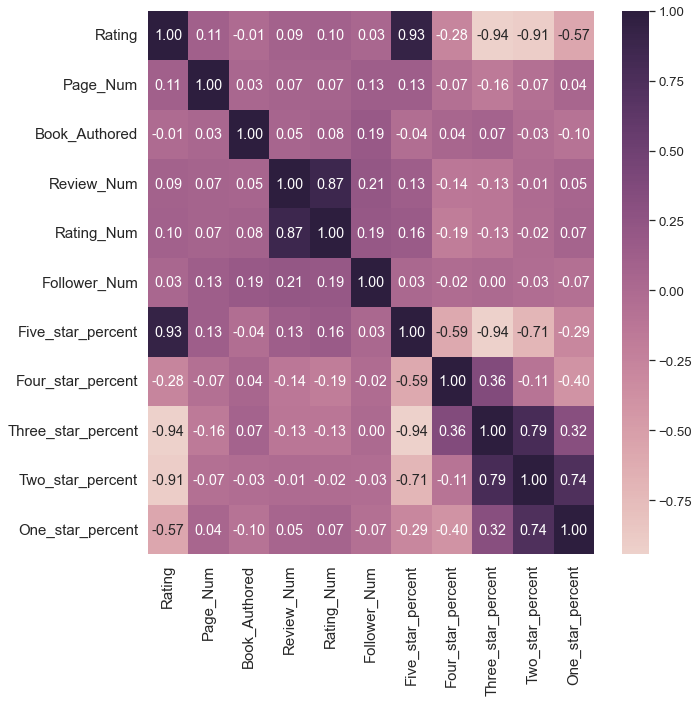

In [76]:
# heat map
labels = ['Rating', 'Page_Num', 'Book_Authored', 'Review_Num', 'Rating_Num', 'Follower_Num', \
          'Five_star_percent', 'Four_star_percent', 'Three_star_percent', 'Two_star_percent', 'One_star_percent']

fig, ax = plt.subplots(figsize=(10,10))
sns.set(font_scale = 1.2)
a = sns.heatmap(df_info[labels].corr(), annot=True, xticklabels=labels, yticklabels=labels, cmap=sns.cubehelix_palette(as_cmap=True), ax=ax, fmt='.2f')
a.set_yticklabels(labels, size = 15)
a.set_xticklabels(labels, size = 15)
plt.show()

- In summary, for the first row, we see only small correlation values between the ***Rating***  and the meta-variables (like page number, rating counts etc.), indicating that there are no strong relationships between the rating a book receives and these features concering a book's basic information;

- This possibly means that the ***Rating*** depends more strongly on other features (e.g. the quality of the books itself). Therefore, it might be more precious to explore the information associated wtih users' reviews, giving more convinced reflection of specic book's quality. 

- Then, we find there are strong correlations between the ***Rating*** and each specific ***Rating percentage***, partially proves our previous thoughts. For example, ***Five stars percentage*** has a nearly perfect positive correlation and the others below five stars show a negative correlation with rating in varying levels;

### 4.4 &nbsp; Combination of scatter plots & KDE plots

- Correlation can only identify ***linear*** correlations, so we will plot scatter plots between features to identify potential ***nonlinear*** relationships
- For the diagonal plots, we illustrate the sample distribution by non-parametric method kernel density estimation (KDE)

<Figure size 5760x4320 with 0 Axes>

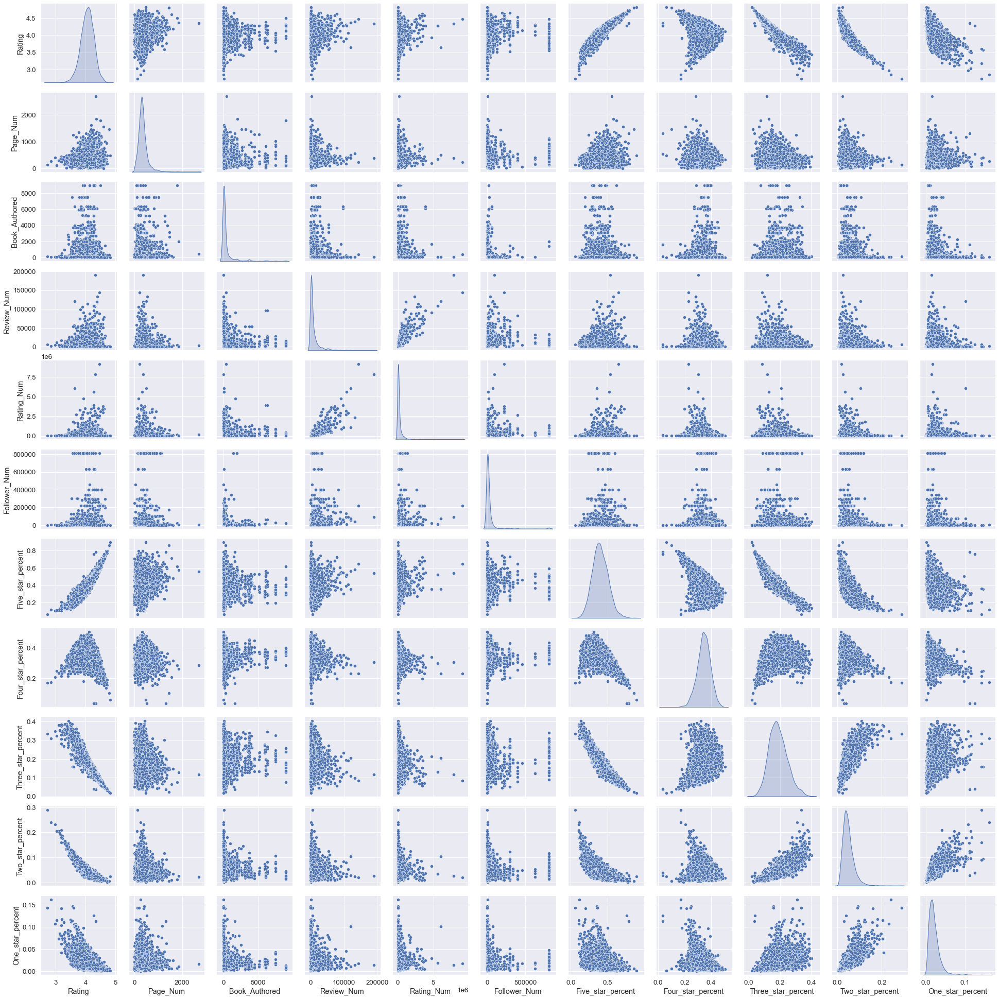

In [77]:
plt.figure(figsize = (80, 60))

sns.pairplot(df_info[labels], kind = 'scatter', diag_kind='kde')
plt.show()

Fortunately there is no obvious non-linear relationships exit between numerical features, but surely we can observe several interesting and suspicious patterns from scatterplot:
- ***Rating*** v.s. ***Four star percentage***: the shape looks like a 'reversed' angle, that may be the reason causing it to have a small absolute value of correlation, and even negative, contradicting our normal thoughts.

- ***Rating Number*** v.s. ***Review Number***: these two seem to have a highly positive linear correlation and that's very reasonable, because normally a user will write some reviews after rating a book and ususally when a book is famous to win more ratings, it normally to get more written reviews.

For distributions of each numerical feature using KDE method, we can see most of them are ***right-skewed***, but with several ***left-skewed*** ones (e.g. Rating, Four star percentage). 
- Right-skewed means they have fewer extremely large values.
- Left skewed means they have fewer extremely small values

---

## Part 5) &nbsp; Exploration of Textual Review Data

In [1]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
from tqdm import tqdm
from textblob import TextBlob
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf

cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

In [2]:
df_reviews = pd.read_csv('Book_reviews_cleaned.csv')
df_reviews.head()

,Uid,Title,Reviewer,N_Review,N_Follower,Review_Rate,Review_Date,Content,N_Likes,N_Comments
0,13642600,A Splash of Red The Life and Art of Horace Pippin,Chaplain Walle,380,18,4,"January 22, 2023",review later,22,0
1,13642600,A Splash of Red The Life and Art of Horace Pippin,Lisa,750,131,5,"November 7, 2014",We enjoyed this beautifully illustrated book a...,11,2
2,13642600,A Splash of Red The Life and Art of Horace Pippin,Moonkiszt,1922,205,3,"January 30, 2022",Featured in a grandma reads session.Exactly wh...,7,0
3,13642600,A Splash of Red The Life and Art of Horace Pippin,Cindy Newton,600,127,4,"June 20, 2020",Cute nonfiction picture book over the life of ...,6,0
4,13642600,A Splash of Red The Life and Art of Horace Pippin,Agnė,744,57,3,"August 16, 2017",A Splash of Red: The Life and Art of Horace Pi...,6,9


### 5.1 &nbsp; Top Words and Word Cloud

#### As the first step, we filtered the top 20 words mentioned in book reviews based on the appearance frequency. Since we haven't filter the stop words yet, we noticed that most top frequency words are auxiliary words. 

In [3]:
comment_words = ''
stopwords = set(STOPWORDS)

for val in tqdm(df_reviews.Content):
    tokens = val.split()
    # to lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
    
    comment_words += " ".join(tokens) + " "

100%|██████████████████████████████████████████████████████████████████████████| 80461/80461 [1:12:54<00:00, 18.39it/s]


In [4]:
from sklearn.feature_extraction.text import CountVectorizer

# get words with top frequencies
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_words(df_reviews['Content'], 20)

for word, freq in common_words:
    print(word, freq)

# visualization
df1 = pd.DataFrame(common_words, columns = ['Content' , 'count'])
df1.groupby('Content').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 words in review before removing stop words')

the 1334391
and 823088
of 729846
to 695062
in 421541
is 407278
it 385106
that 373765
this 293222
was 221708
for 216962
with 198027
book 192865
but 184211
as 183846
you 177307
he 165376
on 149285
not 145569
his 139925


#### Thus, we remove the pre-defined English stop words in scikit-learn package and observe the new top 20 words.

In [25]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words = 'english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_words(df_reviews['Content'], 20)

# see top 20 words removing stop words
for word, freq in common_words:
    print(word, freq)

df2 = pd.DataFrame(common_words, columns = ['Content' , 'count'])
df2.groupby('Content').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 words in review after removing stop words')

book 192865
like 87568
read 85597
just 73570
time 57459
story 56048
really 48680
people 48192
life 48035
love 47677
way 42271
br 41340
good 40057
don 39176
think 38887
know 38611
reading 37283
world 34429
books 34372
did 30932


#### We generate a word cloud to visualize these top words after removing stop words

In [6]:
wordcloud = WordCloud(width = 800, height = 800,
                     background_color = 'white',
                     stopwords = stopwords,
                     min_font_size = 10).generate(comment_words)

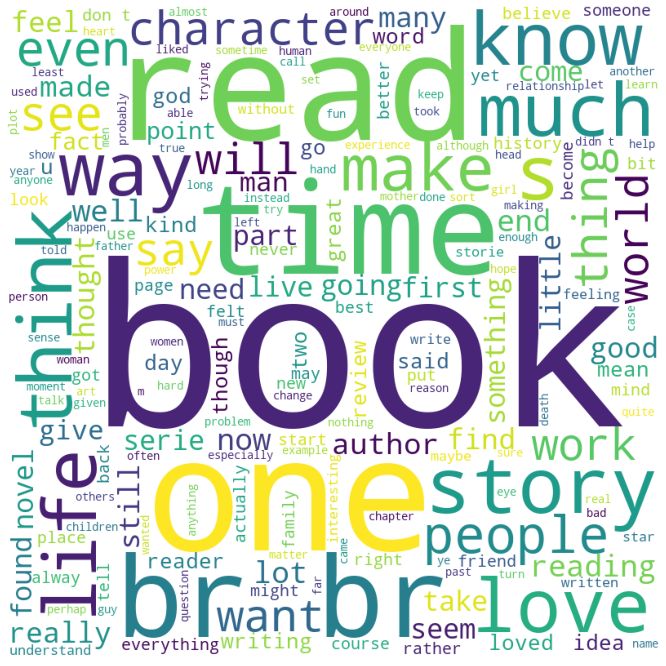

In [7]:
# plot the word cloud
plt.figure(figsize = (12, 12))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

- We noticed that the most frequently mentioned words are `book`, `read`, `time`, `story`, `love`, `life`, `think`, etc. 
- Some of those words can be interpreted as main themes of book content such as `love` and `life`. However, some words including `book` and `read` is too explicitly related to `book reviews`, which may not be able to provide any insights about the main themes or topics of the reviewers' comments.
- Thus, we will add those words to the stop words list and we observe the new word cloud as below.

#### Add explicit but unuseful words into stop words & plot word cloud again

In [23]:
stopwords = STOPWORDS.update(["br", "just", "did", "read", "book", "just", "really", "don", "reading", "books", "one", "s"])
wordcloud2 = WordCloud(width = 800, height = 800,
                     background_color = 'white',
                     stopwords = stopwords,
                     min_font_size = 10).generate(comment_words)

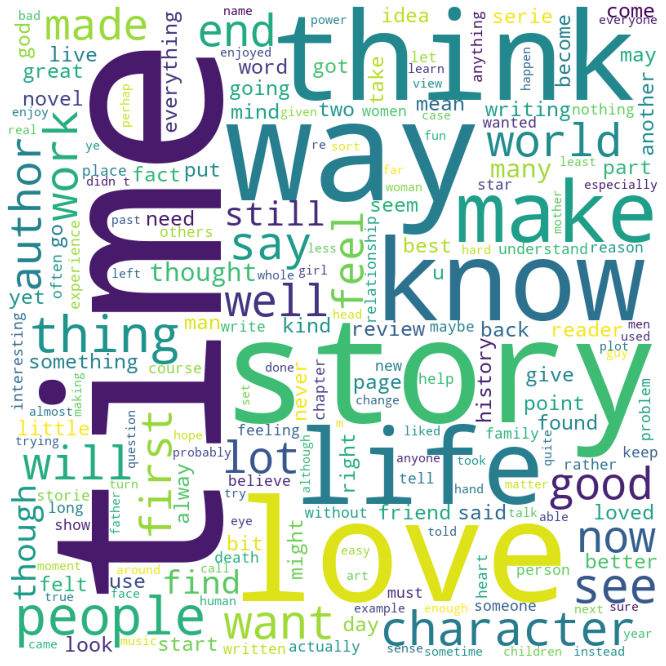

In [24]:
# plot the word cloud after removing new stopwords
plt.figure(figsize = (12, 12))
plt.imshow(wordcloud2)
plt.axis("off")
plt.show()

Now we observe that the most common themes in book reviews may be about `time`, `life`, `story`, `love`, etc. In our later modeling stage of topic modeling, we may cross-checking our generated topics with these findings in this exploratory stage. 

### 5.2 &nbsp; Review Length Distribution

As we have 80,461 reviews in total, knowing the review length distribution and the word count distribution of all reviews are also helpful. 

- According to the two graphs below, both the review length distribution and the word count distribution are ***right-skewed***. 
- We found that more than 50% of review are less than around 1,500 characters or around 200 words, but surely we have some extremely long reviews. The possible reason is that some users would like to cite the book's paragraphs, making their comment extremely long. 
- Such an unbalanced distrubtion may be a bit problematic if we plan to train our own supervised sentiment analysis model, thus we will need to make more careful modeling decision in later stage.
- Nonetheless, for other modeling techniques including topic modeling and summarization, since we would train the models by combing all review text, the unbalanced distribution should cause extra issues. So we might consider filtering some unuseful but extremely long-winded reviews.

In [10]:
df_reviews['review_len'] = df_reviews['Content'].astype(str).apply(len)
df_reviews['word_count'] = df_reviews['Content'].apply(lambda x: len(str(x).split()))

In [11]:
df_reviews['review_len'].iplot(
    kind='hist',
    bins=100,
    xTitle='review length',
    linecolor='black',
    yTitle='count',
    title='Review Text Length Distribution')

In [12]:
df_reviews['word_count'].iplot(
    kind='hist',
    bins=100,
    xTitle='word count',
    linecolor='black',
    yTitle='count',
    title='Review Text Word Count Distribution')

### 5.3 &nbsp; Preliminary Sentiment Analysis

#### We used the ***TextBlob*** toolkit to generate polarity scores for all book reviews, with 
- score `1` indicates `positive`
- score `0` indicates `neutral`
- score `-1` refers to `negative` 

In [13]:
df_reviews['polarity'] = df_reviews['Content'].map(lambda text: TextBlob(text).sentiment.polarity)

We extract 5 random reviews with the highest positive, most neutral, and most negative sentiment scores separately to view the result qualitatively. 

- The extracted samples generally aligned with human sense of `positive`, `neutral`, and `negative`, and we may consider using these sentiment scores as a baseline model in comparison to our future model analysis. 
- One thing to note is that some of the positive attitudes are towards a specific aspect of the book or not refer to the whole book such as `Coffee Crumb Cake Muffins on page 81 are awesome!`. In this case, we may consider training sentiment analysis model for more fine-grained aspect in book reviews and to generate aspect-based sentiment analysis scores. 

In [14]:
print('5 random reviews with the highest positive sentiment polarity: \n')
cl = df_reviews.loc[df_reviews.polarity == 1, ['Content']].sample(5).values
for c in cl:
    print(c[0])

5 random reviews with the highest positive sentiment polarity: 

Brilliant!
Coffee Crumb Cake Muffins on page 81 are awesome!
My phone broke and I couldn't watch tiktoks so I read this instead. Idk how to rate cooking books lol but the soups seem yummy!
A great reference with anything you need to know!
Best way to get lost in your dreams <3


In [15]:
print('5 random reviews with the most neutral sentiment(zero) polarity: \n')
cl = df_reviews.loc[df_reviews.polarity == 0, ['Content']].sample(5).values
for c in cl:
    print(c[0])

5 random reviews with the most neutral sentiment(zero) polarity: 

Listened to the eAudiobook
Sigh... I just can't 
My rating is 4.5 stars
5 Shining Stars.Review soon.
Overreaches the boundaries of scientific inquiry and is ignorant of philosophy and history,


In [16]:
print('5 reviews with the most negative polarity: \n')
cl = df_reviews.loc[df_reviews.polarity == -1, ['Content']].sample(5).values
for c in cl:
    print(c[0])

5 reviews with the most negative polarity: 

A written version of the podcastIf you listen to the podcast, you already have all the information needed from this book. If you haven't listened to the podcast and you get value out of reading, then you will find some value in this book.Be warned: A LOT OF ACRONYMS involved with this book. As an aside, some of our moms were horrible people and we'd rather not remember them even if it is a memory device.Really, save yourself the money and listen to the podcast.
What a fucking terrible book. My god. 
In a word: obnoxious. I've suffered through 57 pages of being told I should resist resistance. Skipping ahead to page 68, I see a chapter on the value of being miserable. No. Just no. I'm done here. 
slay but like this class was so boring
This book is both genius and absolutely terrifying. I think I belong in the nineteenth story.


#### We also plot the setiment polarity to see its distribution

In [17]:
df_reviews['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [18]:
df_reviews['Review_Rate'].iplot(
    kind='hist',
    xTitle='rating',
    linecolor='black',
    yTitle='count',
    title='Review Rating Distribution')

From the sentiment distribution graph, we observed a rather normal distribution centering around `0 - 0.3` area which refers to neutral to postive scores. Such distribution aligned with the review rating distribution with `4` and `5` scores as the majority. 

## Part 6)  &nbsp; Summary & Future Steps

In this module, our group places greater importance to data collection & cleansing and performs a detailed exploratory data analysis of available datasets with various visualizations. Generally our book datasets are balanced in terms of various features across different book genres. We also observed the relationships between the important metric - book ***Ratings*** with other numerical features, which will be insightful for further modeling part.

Based on our findings, we will conduct some minor changes to our current datasets, for example, remove outliers, collect more information for genres with less information to make the dataset more balanced. After that, we will start to discuss suitable machine learning methods for classification of book ratings, being 'Recommend' or not.

For textual data, after the preliminary exploration, we may consider the following modeling techniques towards textual data in later analysis, including

- <b>Aspect-based Sentiment Analysis</b>: to generate more fine-grained polarity score for each aspect of book reviews. For example, reviewers may have different attitudes towards book length, book theme, and book structure. We may want to record those sentiment separately. 
- <b>Topic Modeling</b>: to extract main topics or main themes book reviewers discussed about a book. 
- <b>Summarization</b>: explore potential extractive or abstractive summarization for book reviews for a specific book or specific genre. 